# OpenVINO: combining models into one workflow

This example finds a target person in a video and recognizes their hand signal. No single model solves the whole problem, so the output of one model decides what runs next.

```text
frame -> people -> faces -> face embeddings -> matched person -> gesture
```

The gesture model receives a rolling sequence of matched video frames because signs are movements, not just still hand shapes.

In [16]:
from pathlib import Path
import urllib.request
from collections import deque

import cv2
import matplotlib.pyplot as plt
import numpy as np
import openvino as ov
from IPython.display import Video, display

DEVICE = "AUTO"
MATCH_THRESHOLD = 0.65
INPUT_VIDEO = None
REFERENCE_IMAGE = None
MAX_SECONDS = 8

DATA_DIR = Path("data")
MODEL_DIR = Path("models")
DATA_DIR.mkdir(exist_ok=True)
MODEL_DIR.mkdir(exist_ok=True)

## Download the models

OpenVINO's Intermediate Representation stores each model as an XML graph and a BIN file of weights. These FP16 models come from the Open Model Zoo.

In [17]:
MODEL_NAMES = [
    "person-detection-retail-0013",
    "face-detection-retail-0005",
    "face-reidentification-retail-0095",
    "common-sign-language-0002",
]
MODEL_BASE = "https://storage.openvinotoolkit.org/repositories/open_model_zoo/2023.0/models_bin/1"
SAMPLE_URL = "https://storage.openvinotoolkit.org/data/test_data/videos/classroom.mp4"
LABELS_URL = "https://raw.githubusercontent.com/openvinotoolkit/open_model_zoo/master/data/dataset_classes/common_sign_language12.json"

def download(url, destination):
    destination = Path(destination)
    if not destination.exists():
        print(f"Downloading {destination.name}")
        urllib.request.urlretrieve(url, destination)
    return destination

for model_name in MODEL_NAMES:
    model_folder = MODEL_DIR / model_name
    model_folder.mkdir(exist_ok=True)
    for suffix in ("xml", "bin"):
        download(
            f"{MODEL_BASE}/{model_name}/FP16/{model_name}.{suffix}",
            model_folder / f"{model_name}.{suffix}",
        )

video_path = Path(INPUT_VIDEO) if INPUT_VIDEO else download(SAMPLE_URL, DATA_DIR / "classroom.mp4")
labels_path = download(LABELS_URL, DATA_DIR / "common_sign_language12.json")

## Load and compile once

`Core` discovers the available hardware. Compiling all four models up front lets the rest of the notebook treat them like ordinary Python callables.

In [18]:
core = ov.Core()

def compile_model(name):
    path = MODEL_DIR / name / f"{name}.xml"
    return core.compile_model(path, DEVICE)

person_model = compile_model("person-detection-retail-0013")
face_model = compile_model("face-detection-retail-0005")
identity_model = compile_model("face-reidentification-retail-0095")
gesture_model = compile_model("common-sign-language-0002")

print("Available devices:", core.available_devices)
for name, model in {
    "people": person_model,
    "faces": face_model,
    "identity": identity_model,
    "gesture": gesture_model,
}.items():
    print(f"{name:>8}: {model.input(0).partial_shape} -> {[str(output.partial_shape) for output in model.outputs]}")

Available devices: ['CPU', 'GPU']
  people: [1,3,320,544] -> ['[1,1,200,7]']
   faces: [1,3,300,300] -> ['[1,1,200,7]']
identity: [1,3,128,128] -> ['[1,256,1,1]']
 gesture: [1,3,8,224,224] -> ['[1,12]']


## Small preprocessing helpers

In [19]:
def model_image(model, image):
    _, _, height, width = model.input(0).shape
    resized = cv2.resize(image, (int(width), int(height)))
    return resized.transpose(2, 0, 1)[None]

def detect(model, image, threshold):
    output = model(model_image(model, image))[model.output(0)]
    height, width = image.shape[:2]
    _, _, input_height, input_width = model.input(0).shape
    boxes = []

    if output.shape[-1] == 5:
        detections = output.reshape(-1, 5)
        detections[:, [0, 2]] *= width / float(input_width)
        detections[:, [1, 3]] *= height / float(input_height)
    else:
        detections = output.reshape(-1, 7)[:, [3, 4, 5, 6, 2]]
        detections[:, [0, 2]] *= width
        detections[:, [1, 3]] *= height

    for x1, y1, x2, y2, confidence in detections:
        if confidence < threshold:
            continue
        # Keep boxes half-open for NumPy slicing and include fractional edge pixels.
        box = np.array([np.floor(x1), np.floor(y1), np.ceil(x2), np.ceil(y2)], dtype=int)
        box[[0, 2]] = box[[0, 2]].clip(0, width)
        box[[1, 3]] = box[[1, 3]].clip(0, height)
        boxes.append((box, float(confidence)))
    return boxes

def crop(image, box):
    x1, y1, x2, y2 = box
    return image[y1:y2, x1:x2]

def face_embedding(face):
    vector = identity_model(model_image(identity_model, face))[identity_model.output(0)].reshape(-1)
    return vector / np.linalg.norm(vector)

def find_faces_in_people(frame):
    results = []
    for person_box, person_score in detect(person_model, frame, 0.55):
        person = crop(frame, person_box)
        if person.size == 0:
            continue
        for local_face_box, face_score in detect(face_model, person, 0.55):
            face = crop(person, local_face_box)
            if face.size:
                results.append((person_box, local_face_box, face, person_score, face_score))
    return results

## Choose the person to find

For a self-contained demo, the notebook scans the opening video frames and enrolls the largest clear face. Set `REFERENCE_IMAGE` to a portrait path to search for a specific person instead.

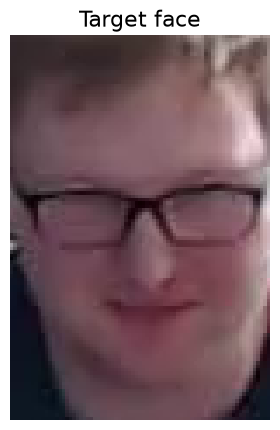

In [20]:
capture = cv2.VideoCapture(str(video_path))
if not capture.isOpened():
    raise RuntimeError(f"Could not open {video_path}")

source_fps = capture.get(cv2.CAP_PROP_FPS) or 30
frame_width = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))

if REFERENCE_IMAGE:
    reference_image = cv2.imread(str(REFERENCE_IMAGE))
    if reference_image is None:
        raise RuntimeError(f"Could not open {REFERENCE_IMAGE}")
    reference_faces = detect(face_model, reference_image, 0.55)
    if not reference_faces:
        raise RuntimeError("No face was found in REFERENCE_IMAGE")
    reference_box = max(reference_faces, key=lambda item: np.prod(item[0][2:] - item[0][:2]))[0]
    reference_face = crop(reference_image, reference_box)
    start_frame = 0
else:
    reference_face = None
    start_frame = 0
    for frame_number in range(int(source_fps * 5)):
        success, frame = capture.read()
        if not success:
            break
        if frame_number % max(1, int(source_fps // 5)):
            continue
        candidates = find_faces_in_people(frame)
        if candidates:
            reference_face = max(candidates, key=lambda item: item[2].shape[0] * item[2].shape[1])[2]
            start_frame = frame_number
            break
    if reference_face is None:
        raise RuntimeError("No face was found in the opening video frames")

reference_vector = face_embedding(reference_face)
capture.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(reference_face, cv2.COLOR_BGR2RGB))
plt.title("Target face", fontsize=16)
plt.axis("off")
plt.show()

## Run the conditional pipeline

Every output frame runs person detection. Face detection and comparison run for each detected person. Only the person whose face passes the similarity threshold is added to the rolling gesture clip.

In [24]:
def draw_label(frame, text, origin, color):
    font = cv2.FONT_HERSHEY_SIMPLEX
    scale = max(0.7, frame.shape[1] / 1400)
    thickness = max(2, int(scale * 2))
    (width, height), baseline = cv2.getTextSize(text, font, scale, thickness)
    x = min(max(8, origin[0]), frame.shape[1] - width - 8)
    y = min(max(height + 12, origin[1]), frame.shape[0] - baseline - 8)
    cv2.rectangle(frame, (x - 6, y - height - 8), (x + width + 6, y + baseline + 5), (20, 20, 20), -1)
    cv2.putText(frame, text, (x, y), font, scale, color, thickness, cv2.LINE_AA)

clip_length = int(gesture_model.input(0).shape[2])
target_frames = deque(maxlen=clip_length)
gesture_labels = __import__("json").loads(labels_path.read_text())
output_path = DATA_DIR / "openvino_result.webm"
frame_step = max(1, round(source_fps / 15))
output_fps = source_fps / frame_step
capture.release()
capture = cv2.VideoCapture(str(video_path))
if not capture.isOpened():
    raise RuntimeError(f"Could not reopen {video_path}")
capture.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
writer = cv2.VideoWriter(str(output_path), cv2.VideoWriter_fourcc(*"VP80"), output_fps, (frame_width, frame_height))
if not writer.isOpened():
    raise RuntimeError("Could not create the output video")

processed_frames = 0
face_comparisons = 0
gesture_result = "collecting frames"
gesture_confidence = 0.0
source_frame = start_frame
max_output_frames = int(MAX_SECONDS * output_fps)

while processed_frames < max_output_frames:
    success, frame = capture.read()
    if not success:
        break
    source_frame += 1
    if (source_frame - start_frame) % frame_step:
        continue

    annotated = frame.copy()
    best_match = None
    people = detect(person_model, frame, 0.55)

    for person_number, (person_box, person_score) in enumerate(people, start=1):
        x1, y1, x2, y2 = person_box
        person = crop(frame, person_box)
        person_similarity = None

        if person.size:
            faces = detect(face_model, person, 0.55)
            for local_face_box, face_score in faces:
                face = crop(person, local_face_box)
                if not face.size:
                    continue
                similarity = float(reference_vector @ face_embedding(face))
                face_comparisons += 1
                person_similarity = max(person_similarity or -1, similarity)
                fx1, fy1, fx2, fy2 = local_face_box + np.array([x1, y1, x1, y1])
                cv2.rectangle(annotated, (fx1, fy1), (fx2, fy2), (255, 190, 40), 2)

        matched = person_similarity is not None and person_similarity >= MATCH_THRESHOLD
        color = (50, 220, 80) if matched else (170, 170, 170)
        cv2.rectangle(annotated, (x1, y1), (x2, y2), color, 4 if matched else 2)
        score_text = f" face {person_similarity:.2f}" if person_similarity is not None else " no face"
        draw_label(annotated, f"person {person_number}:{score_text}", (x1, y1 - 10), color)

        if matched and (best_match is None or person_similarity > best_match[0]):
            best_match = (person_similarity, person_box, person_number)

    if best_match is not None:
        selected_similarity, selected_box, selected_number = best_match
        x1, y1, x2, y2 = selected_box
        highlight_color = (0, 215, 255)
        cv2.rectangle(annotated, (x1, y1), (x2 - 1, y2 - 1), highlight_color, 6)
        draw_label(annotated, f"selected person {selected_number}: {selected_similarity:.2f}", (x1, y1 + 45), highlight_color)
        target = crop(frame, selected_box)
        target_frames.append(target)

    if len(target_frames) == clip_length and processed_frames % clip_length == 0:
        clip = []
        for target in target_frames:
            image = cv2.resize(target, (224, 224))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            clip.append(image.transpose(2, 0, 1))
        clip = np.stack(clip, axis=1)[None].astype(np.float32)
        logits = gesture_model(clip)[gesture_model.output(0)].reshape(-1)
        probabilities = np.exp(logits - logits.max())
        probabilities /= probabilities.sum()
        best_id = int(probabilities.argmax())
        gesture_confidence = float(probabilities[best_id])
        gesture_result = gesture_labels[best_id] if gesture_confidence >= 0.50 else "uncertain"

    draw_label(annotated, f"gesture: {gesture_result} ({gesture_confidence:.0%})", (18, 45), (255, 255, 255))
    draw_label(annotated, f"people: {len(people)} | target clip: {len(target_frames)}/{clip_length}", (18, 120), (255, 255, 255))
    writer.write(annotated)
    processed_frames += 1

capture.release()
writer.release()

OpenCV: FFMPEG: tag 0x30385056/'VP80' is not supported with codec id 139 and format 'webm / WebM'


In [25]:
print(f"Processed frames: {processed_frames}")
print(f"Face comparisons: {face_comparisons}")
print(f"Final gesture:    {gesture_result} ({gesture_confidence:.1%})")
display(Video(str(output_path), embed=True, width=960))

Processed frames: 120
Face comparisons: 480
Final gesture:    uncertain (10.9%)


## Inspect the result

Gray boxes are detected people, blue boxes are faces, green boxes pass the identity threshold, and the yellow frame highlights the best match selected for gesture recognition. The temporal gesture model receives only the selected person's crops. Low confidence is reported as uncertain rather than forced into a label.

In [23]:
print("The output video is saved at:", output_path.resolve())
print("Use your own INPUT_VIDEO and REFERENCE_IMAGE for a meaningful identity and gesture test.")

The output video is saved at: /home/user/Desktop/guy-work/Intro-to-practical-AI-course/openvino-example/data/openvino_result.webm
Use your own INPUT_VIDEO and REFERENCE_IMAGE for a meaningful identity and gesture test.


## What this workflow demonstrates

- One `ov.Core` can compile models with different inputs and outputs for the same device.
- Detection results become crops for downstream models.
- Face embeddings are compared with cosine similarity rather than class labels.
- Routing saves work: gesture recognition runs only after identity is established.
- A production version would add face alignment, tracking, threshold calibration, consent controls, and tests on the actual camera environment.